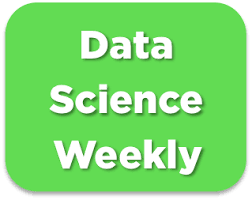

# Challenge : predict conversions 🏆🏆
In this project, you will participate to a machine learning competition like the ones that are organized by https://www.kaggle.com/. You will be able to work with jupyter notebooks as usual, but in the end you'll have to submit your model's predictions to your teacher/TA, so your model's performances will be evaluated in an independent way. The scores achieved by the different teams will be stored into a leaderboard 🏅🏅

## Description of a machine learning challenge 🚴🚴
- In machine learning challenges, the dataset is always separated into to files :
    - *data_train.csv* contains **labelled data**, which means there are both X (explanatory variables) and Y (the target to be predicted). You will use this file to train your model as usual : make the train/test split, preprocessings, assess performances, try different models, fine-tune hyperparameters etc...
    - *data_test.csv* contains "new" examples that have not be used to train the model, in the same format as in *data_train.csv* but it is **unlabeled**, which means the target Y has been removed from the file. Once you've trained a model, you will use *data_test.csv* to make some predictions that you will send to the organizing team. They will then be able to assess the performances of your model in an independent way, by preventing cheating 🤸
- Your model's predictions will be compared to the true labels and releases a leaderboard where the scores of all the teams around the world are stored
- All the participants are informed about the metric that will be used to assess the scores. You have to make sure you're using the same metric to evaluate your train/test performances !

## Company's Description 📇
www.datascienceweekly.org is a famous newsletter curated by independent data scientists. Anyone can register his/her e-mail address on this website to receive weekly news about data science and its applications !

## Project 🚧
The data scientists who created the newsletter would like to understand better the behaviour of the users visiting their website. They would like to know if it's possible to build a model that predicts if a given user will subscribe to the newsletter, by using just a few information about the user. They would like to analyze the parameters of the model to highlight features that are important to explain the behaviour of the users, and maybe discover a new lever for action to improve the newsletter's conversion rate.

They designed a competition aiming at building a model that allows to predict the *conversions* (i.e. when a user will subscribe to the newsletter). To do so, they open-sourced a dataset containing some data about the traffic on their website. To assess the rankings of the different competing teams, they decided to use the **f1-score**.

## Goals 🎯
The project can be cut into four steps :
- Part 1 : make an EDA and the preprocessings and train a baseline model with the file *data_train.csv*
- Part 2 : improve your model's f1-score on your test set (you can try feature engineering, feature selection, regularization, non-linear models, hyperparameter optimization by grid search, etc...)
- Part 3 : Once you're satisfied with your model's score, you can use it to make some predictions with the file *data_test.csv*. You will have to dump the predictions into a .csv file that will be sent to Kaggle (actually, to your teacher/TA 🤓). You can make as many submissions as you want, feel free to try different models !
- Part 4 : Take some time to analyze your best model's parameters. Are there any lever for action that would help to improve the newsletter's conversion rate ? What recommendations would you make to the team ?

## Deliverable 📬
To complete this project, your team should: 
- Create some relevant figures for EDA
- Train at least one model that predicts the conversions and evaluate its performances (f1, confusion matrices)
- Make at least one submission to the leaderboard 
- Analyze your best model's parameters and try to make some recommendations to improve the conversion rate in the future

In [2]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay

from imblearn.over_sampling import SMOTENC, SMOTE
from collections import Counter

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# Dataset exploration

In [3]:
data = pd.read_csv('conversion_data_train.csv')
print('Set with labels (our train+test) :', data.shape)
data.head()

Set with labels (our train+test) : (284580, 6)


,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


## Basic exploration

In [12]:
print("\nBasics statistics: ")
display(data.describe(include="all"))

print("\nPercentage of missing values: ")
display(100 * data.isnull().sum() / data.shape[0])

print("\nNumber of duplicated lines: ")
print(data.duplicated().sum())


Basics statistics: 


,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000



Percentage of missing values: 


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64


Number of duplicated lines: 
268769


Remarques générales :
- la target est fortement imbalanced : les converted (valeur = 1) ne représentent que 3% du dataset -> il faudra le prendre en compte dans les modèles (c'est-à-dire : stratify pendant la création du train et du test, utiliser un score F1 pour choisir le meilleur modèle)
- pas de missing values -> pas besoin de faire de l'imputation
- plus de 94% du dataset est constitué de lignes dupliquées : cela illustre qu'on manque de features
- outliers : il semble y avoir des valeurs aberrantes, ou du moins extrèmes, pour l'âge -> à regarder plus en détail

In [18]:
px.box(data, 'age')

# cela semble bien être deux uniques valeurs aberrantes > 100 ans : elles sont loin du reste de la distribution

In [13]:
data = data.loc[data['age']<80,:]
data.shape

# on a bien retiré 2 lignes

(284578, 6)

## EDA

In [8]:
fig = px.bar(data['country'].value_counts(), "count", title="Distribution of countries")
fig.show()

px.histogram(data.replace({0:'No', 1:'Yes'}), "country", color="converted", barnorm='percent',
            text_auto='.01f', title="Conversion according to the country", width=800, height=600)

In [33]:
px.line(data.groupby('age')[['converted']].mean(),
              title='Mean conversion according to the age')

In [19]:
fig = px.bar(data['new_user'].value_counts(), "count", title="Distribution of new_user")
fig.show()

px.histogram(data.replace({0:'No', 1:'Yes'}), "new_user", color="converted", barnorm='percent',
            text_auto='.01f', title="Conversion according to new_user", width=800, height=600)

In [20]:
fig = px.bar(data['source'].value_counts(), "count", title="Distribution of source")
fig.show()

px.histogram(data.replace({0:'No', 1:'Yes'}), "source", color="converted", barnorm='percent',
            text_auto='.01f', title="Conversion according to source", width=800, height=600)

In [32]:
px.line(data.groupby('total_pages_visited')[['converted']].mean(),
              title='Mean conversion according to total_pages_visited')

Conclusions : 
- l'âge, le fait d'être un nouvel utilisateur et le nombre de pages visitées sont très nettement corrélées avec le taux de conversion : une personne de moins de 30 ans, nouvelle utilisatrice et visitant au moins 10 pages a plus de chances de s'inscrire
- le pays a un effet, mais qui ne semble pas très fort
- la source a un faible effet sur le taux de conversion

## Feature engineering

In [22]:
data['AgexPages'] = data['age'] * data['total_pages_visited']
data['Age/Pages'] = data['age'] / data['total_pages_visited']
data['AgexNew'] = data['age'] * data['new_user'].replace({0:0.5, 1:1})
data['PagesxNew'] = data['total_pages_visited'] * data['new_user'].replace({0:0.5, 1:1})

data.head()

,country,age,new_user,source,total_pages_visited,converted,AgexPages,Age/Pages,AgexNew,PagesxNew
0,China,22,1,Direct,2,0,44,11.000000,22.0,2.0
1,UK,21,1,Ads,3,0,63,7.000000,21.0,3.0
2,Germany,20,0,Seo,14,1,280,1.428571,10.0,7.0
3,US,23,1,Seo,3,0,69,7.666667,23.0,3.0
4,US,28,1,Direct,3,0,84,9.333333,28.0,3.0


In [31]:
px.line(data.groupby('AgexPages')[['converted']].mean(),
              title='Mean conversion according to Age x Pages')

In [30]:
px.line(data.groupby('Age/Pages')[['converted']].mean(),
              title='Mean conversion according to Age / Pages')

In [27]:
px.line(data.groupby('AgexNew')[['converted']].mean(),
              title='Mean conversion according to Age x New')

In [29]:
px.line(data.groupby('PagesxNew')[['converted']].mean(),
              title='Mean conversion according to Pages x New')

Conclusions : on pourra utiliser comme feature engineering pour améliorer les modèles, en plus des opérations classiques sur les deux variables quantitatives (carré, racine carrée, log, etc.), Age/Pages et AgexNew